In [1]:
import pandas as pd
import ast
from wordcloud.wordcloud import WordCloud
from matplotlib import pyplot as plt
import plotly.express as px
from collections import Counter, OrderedDict
from itertools import combinations
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori
from geopy.geocoders import Nominatim
import folium
from folium.plugins import HeatMap, MarkerCluster
from nltk.corpus import stopwords
from tqdm import tqdm
import warnings

In [2]:
warnings.filterwarnings('ignore')

In [3]:
df = pd.read_csv("C:/Users/krish/DAV/zomato.csv")
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1/5,775,080 42297555\r\n+91 9743772233,Banashankari,Casual Dining,"Pasta, Lunch Buffet, Masala Papad, Paneer Laja...","North Indian, Mughlai, Chinese",800,"[('Rated 4.0', 'RATED\n A beautiful place to ...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1/5,787,080 41714161,Banashankari,Casual Dining,"Momos, Lunch Buffet, Chocolate Nirvana, Thai G...","Chinese, North Indian, Thai",800,"[('Rated 4.0', 'RATED\n Had been here for din...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8/5,918,+91 9663487993,Banashankari,"Cafe, Casual Dining","Churros, Cannelloni, Minestrone Soup, Hot Choc...","Cafe, Mexican, Italian",800,"[('Rated 3.0', ""RATED\n Ambience is not that ...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7/5,88,+91 9620009302,Banashankari,Quick Bites,Masala Dosa,"South Indian, North Indian",300,"[('Rated 4.0', ""RATED\n Great food and proper...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8/5,166,+91 8026612447\r\n+91 9901210005,Basavanagudi,Casual Dining,"Panipuri, Gol Gappe","North Indian, Rajasthani",600,"[('Rated 4.0', 'RATED\n Very good restaurant ...",[],Buffet,Banashankari


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51717 entries, 0 to 51716
Data columns (total 17 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   url                          51717 non-null  object
 1   address                      51717 non-null  object
 2   name                         51717 non-null  object
 3   online_order                 51717 non-null  object
 4   book_table                   51717 non-null  object
 5   rate                         43942 non-null  object
 6   votes                        51717 non-null  int64 
 7   phone                        50509 non-null  object
 8   location                     51696 non-null  object
 9   rest_type                    51490 non-null  object
 10  dish_liked                   23639 non-null  object
 11  cuisines                     51672 non-null  object
 12  approx_cost(for two people)  51371 non-null  object
 13  reviews_list                 51

In [5]:
df.duplicated().sum()

0

In [6]:
df.isnull().sum()

url                                0
address                            0
name                               0
online_order                       0
book_table                         0
rate                            7775
votes                              0
phone                           1208
location                          21
rest_type                        227
dish_liked                     28078
cuisines                          45
approx_cost(for two people)      346
reviews_list                       0
menu_item                          0
listed_in(type)                    0
listed_in(city)                    0
dtype: int64

In [7]:
df.dropna(inplace=True)

In [8]:
df['phone'] = df['phone'].apply(lambda x: [i.strip() for i in str(x).split('\r\n')])
df['rest_type'] = df['rest_type'].apply(lambda x: [i.strip() for i in str(x).split(',')])
df['dish_liked'] = df['dish_liked'].apply(lambda x: [i.strip() for i in str(x).split(',')])
df['cuisines'] = df['cuisines'].apply(lambda x: [i.strip() for i in str(x).split(',')])

In [9]:
df['reviews_list'] = df['reviews_list'].apply(ast.literal_eval)
df['menu_item'] = df['menu_item'].apply(ast.literal_eval)

In [10]:
df['rate'] = df['rate'].apply(lambda x: 0 if x == 'NEW' or x == '-' else float(str(x).split('/')[0]))
df.head()

,url,address,name,online_order,book_table,rate,votes,phone,location,rest_type,dish_liked,cuisines,approx_cost(for two people),reviews_list,menu_item,listed_in(type),listed_in(city)
0,https://www.zomato.com/bangalore/jalsa-banasha...,"942, 21st Main Road, 2nd Stage, Banashankari, ...",Jalsa,Yes,Yes,4.1,775,"[080 42297555, +91 9743772233]",Banashankari,[Casual Dining],"[Pasta, Lunch Buffet, Masala Papad, Paneer Laj...","[North Indian, Mughlai, Chinese]",800,"[(Rated 4.0, RATED\n A beautiful place to din...",[],Buffet,Banashankari
1,https://www.zomato.com/bangalore/spice-elephan...,"2nd Floor, 80 Feet Road, Near Big Bazaar, 6th ...",Spice Elephant,Yes,No,4.1,787,[080 41714161],Banashankari,[Casual Dining],"[Momos, Lunch Buffet, Chocolate Nirvana, Thai ...","[Chinese, North Indian, Thai]",800,"[(Rated 4.0, RATED\n Had been here for dinner...",[],Buffet,Banashankari
2,https://www.zomato.com/SanchurroBangalore?cont...,"1112, Next to KIMS Medical College, 17th Cross...",San Churro Cafe,Yes,No,3.8,918,[+91 9663487993],Banashankari,"[Cafe, Casual Dining]","[Churros, Cannelloni, Minestrone Soup, Hot Cho...","[Cafe, Mexican, Italian]",800,"[(Rated 3.0, RATED\n Ambience is not that goo...",[],Buffet,Banashankari
3,https://www.zomato.com/bangalore/addhuri-udupi...,"1st Floor, Annakuteera, 3rd Stage, Banashankar...",Addhuri Udupi Bhojana,No,No,3.7,88,[+91 9620009302],Banashankari,[Quick Bites],[Masala Dosa],"[South Indian, North Indian]",300,"[(Rated 4.0, RATED\n Great food and proper Ka...",[],Buffet,Banashankari
4,https://www.zomato.com/bangalore/grand-village...,"10, 3rd Floor, Lakshmi Associates, Gandhi Baza...",Grand Village,No,No,3.8,166,"[+91 8026612447, +91 9901210005]",Basavanagudi,[Casual Dining],"[Panipuri, Gol Gappe]","[North Indian, Rajasthani]",600,"[(Rated 4.0, RATED\n Very good restaurant in ...",[],Buffet,Banashankari


# Restaurant Type Counts

In [11]:
type_counts = df['rest_type'].explode().value_counts()
fig = px.bar(type_counts, title='Restaurant Type Counts', width=900, height=600)
fig.update_traces(marker_color='#00215E')

# Cost based on Number of Cuisines

In [12]:
df.rename({ 'approx_cost(for two people)': 'approx_cost' }, axis=1, inplace=True)
df['approx_cost'] = df['approx_cost'].str.replace(',', '').astype(float)

In [13]:
# Calculate the mean of 'approx_cost' for each group
mean_cost_by_cuisines = df.groupby(df.cuisines.apply(len))['approx_cost'].mean()

# Create a new DataFrame with the aggregated values
cuisines_count_cost = pd.DataFrame({
    'number of cuisines': mean_cost_by_cuisines.index,
    'approx_cost': mean_cost_by_cuisines.values
})

# Create the bar chart using Plotly Express
fig = px.bar(cuisines_count_cost, x='number of cuisines', y='approx_cost',
             title='Cost based on Number of cuisines', width=700, height=500)
fig.update_traces(marker_color='#874CCC')

# Show the plot
fig.show()


# Cuisine Options

In [14]:
cuisines_counts = df['cuisines'].explode().value_counts()
fig = px.bar(cuisines_counts[:25], title='Cuisine Options',  width=900, height=600)
fig.update_traces(marker_color='#00215E')

In [15]:
topc = df['cuisines'].explode().value_counts().index[:5]
cats = []
for c in df['cuisines']:
    cc = 0
    for i in c:
        if i in topc and len(c) > 3:
            cc += 1
    if cc > 2:
        cats.append(c)

In [16]:
te = TransactionEncoder()
te_ary = te.fit(cats).transform(cats)
cdf = pd.DataFrame(te_ary, columns=te.columns_)
cdf = cdf[cdf.sum(axis=1) > 2]
apriori(cdf, use_colnames=True)

,support,itemsets
0,0.893617,(Chinese)
1,0.732406,(Continental)
2,0.896890,(North Indian)
3,0.634206,"(Continental, Chinese)"
4,0.815057,"(Chinese, North Indian)"
5,0.638298,"(Continental, North Indian)"
6,0.564648,"(Continental, Chinese, North Indian)"


In [17]:
def common_cuisine_count(num):
    d  = Counter()
    for sub in df['cuisines']:
        if len(sub) < num:
            continue
        sub.sort()
        for comb in combinations(sub, num):
            d[comb] += 1
    res = [(*x[0], x[1]) for x in d.most_common()[:5]]
    return pd.DataFrame(res, index=range(1, 6), columns=[*range(1, num + 1), 'count'])
common_cuisine_count(2)

,1,2,count
1,Chinese,North Indian,5357
2,North Indian,South Indian,1884
3,Continental,North Indian,1879
4,Biryani,North Indian,1739
5,Chinese,South Indian,1513


In [18]:
common_cuisine_count(3)

,1,2,3,count
1,Chinese,North Indian,South Indian,1367
2,Biryani,Chinese,North Indian,1065
3,Chinese,Continental,North Indian,942
4,Chinese,North Indian,Seafood,525
5,Cafe,Continental,Italian,484


In [19]:
common_cuisine_count(4)

,1,2,3,4,count
1,Andhra,Biryani,Chinese,North Indian,258
2,Chinese,North Indian,South Indian,Street Food,227
3,Chinese,Continental,North Indian,South Indian,193
4,Biryani,Chinese,North Indian,Seafood,190
5,Biryani,Chinese,North Indian,South Indian,189


In [20]:
common_cuisine_count(5)

,1,2,3,4,5,count
1,Biryani,Chinese,North Indian,Seafood,South Indian,77
2,Chinese,Kerala,North Indian,Seafood,South Indian,72
3,Biryani,Chinese,Kerala,North Indian,South Indian,59
4,Biryani,Chinese,Kerala,Seafood,South Indian,55
5,American,Burger,Cafe,Italian,Steak,54


In [21]:
common_cuisine_count(6)

,1,2,3,4,5,6,count
1,Biryani,Chinese,Kerala,North Indian,Seafood,South Indian,46
2,Beverages,Burger,Cafe,Desserts,Ice Cream,Pizza,36
3,American,Biryani,Burger,Chinese,Continental,Healthy Food,24
4,American,Biryani,Burger,Chinese,Continental,North Indian,24
5,American,Biryani,Burger,Chinese,Continental,Salad,24


# Dishes Liked

In [22]:
dish_liked_counts = df['dish_liked'].explode().value_counts()
fig = px.bar(dish_liked_counts[:25], width=900, height=600, title='Dishes Liked')
fig.update_traces(marker_color='#00215E')

# Distribution of Rating

In [23]:
px.box(df, 'rate')

In [24]:
fig = px.histogram(df, 'rate', title='Rate Distribution', width=700, height=500)
fig.update_traces(marker_color='#874CCC')

# Distribution of Cost

In [25]:
px.box(df, 'approx_cost', title='Approximate Cost for 2')

# Features of the restaurents

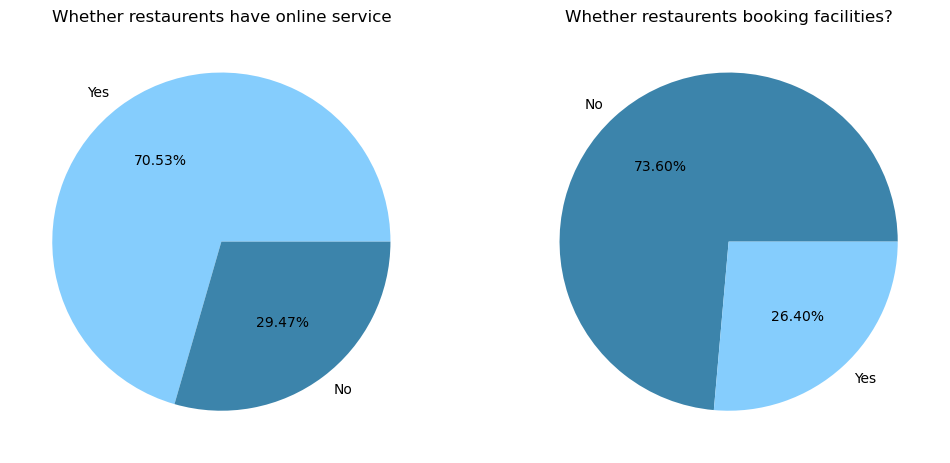

In [26]:
plt.figure(figsize=(12, 7))
plt.subplot(1, 2, 1)
online_order_counts = df['online_order'].value_counts()
plt.pie(online_order_counts, autopct='%.2f%%', labels=online_order_counts.index, colors=['#85CDFD', '#3C84AB'])
plt.title('Whether restaurents have online service')
plt.subplot(1, 2, 2)
online_order_counts = df['book_table'].value_counts()
plt.pie(online_order_counts, autopct='%.2f%%', labels=online_order_counts.index, colors=['#3C84AB', '#85CDFD'])
plt.title('Whether restaurents booking facilities?')
plt.show()

# Does the Online Order Feature affect its Rating?

In [27]:
order_rate = pd.crosstab(df['rate'], df['online_order'])
px.bar(order_rate, title='Does online order feature affects rating?', width=1000, height=500, color_discrete_map={
        'Yes': '#85CDFD',
        'No': '#3C84AB'
    }
)

In [28]:
px.scatter(df, x='rate',  y='approx_cost', color='online_order', width=700, height=500)

# Does the Table Booking Feature affect its Rating?

In [29]:
book_rate = pd.crosstab(df['rate'], df['book_table'])
px.bar(book_rate, title='Does table booking feature affects rating?', width=1000, height=500, color_discrete_map={
        'Yes': '#85CDFD',
        'No': '#3C84AB'
    }
)

In [30]:
px.scatter(df, x='rate',  y='approx_cost', color='book_table', width=700,height=500)

# Approximate Cost for Online Order

In [31]:
px.box(df,x='online_order',y='approx_cost', title='Approx cost and Online Order', width=600, height=700)

# Location of the Restaurants

In [32]:
geolocator = Nominatim(user_agent="ny_explorer")
ll_dict = {}
for location in df['location'].unique():
    location = location + ', Bengaluru, India'
    try:
        loc = geolocator.geocode(location)
        ll_dict[location] = (loc.latitude, loc.longitude)
    except:
        loc = geolocator.geocode('Bengaluru, India')
        ll_dict[location] = (loc.latitude, loc.longitude)

In [33]:
ll_dict

{'Banashankari, Bengaluru, India': (12.9393328, 77.5539819),
 'Basavanagudi, Bengaluru, India': (12.9417261, 77.5755021),
 'Jayanagar, Bengaluru, India': (12.9399039, 77.5826382),
 'Kumaraswamy Layout, Bengaluru, India': (12.9067683, 77.5595021),
 'Rajarajeshwari Nagar, Bengaluru, India': (12.9274413, 77.5155224),
 'Mysore Road, Bengaluru, India': (12.953672, 77.5425121),
 'Uttarahalli, Bengaluru, India': (12.9055682, 77.5455438),
 'South Bangalore, Bengaluru, India': (12.864107149999999, 77.55441638924378),
 'Vijay Nagar, Bengaluru, India': (12.9660722, 77.6125940647638),
 'Bannerghatta Road, Bengaluru, India': (12.9521804, 77.6041899),
 'JP Nagar, Bengaluru, India': (12.9096941, 77.5866067),
 'BTM, Bengaluru, India': (12.9163603, 77.604733),
 'Wilson Garden, Bengaluru, India': (12.9489339, 77.5968273),
 'Koramangala 5th Block, Bengaluru, India': (12.9348429, 77.6189768),
 'Shanti Nagar, Bengaluru, India': (12.9575547, 77.5979099),
 'Richmond Road, Bengaluru, India': (12.9715695, 77.6

In [34]:
df['loc_lat']= df['location'].map(lambda x: ll_dict[x + ', Bengaluru, India'][0])
df['loc_lon']= df['location'].map(lambda x: ll_dict[x + ', Bengaluru, India'][1])

In [35]:
location_counts = df['location'].value_counts()
fig = px.bar(location_counts[:25], title='Location Counts', width=900, height=600)
fig.update_traces(marker_color='#00215E')

In [36]:
base_map = folium.Map(location=[12.9716, 77.5946], zoom_start=12)

for i in ll_dict:
    lat, lon = ll_dict[i]
    base_map.add_child(folium.Marker(
        location=ll_dict[i]
    ))

base_map

In [37]:
base_map = folium.Map(location=[12.9716, 77.5946], zoom_start=12)
HeatMap(df[['loc_lat', 'loc_lon']]).add_to(base_map)
base_map

In [38]:
base_map = folium.Map(location=[12.9716, 77.5946], zoom_start=12)
marker_cluster = MarkerCluster().add_to(base_map)

for _, row in df.iterrows():
    folium.Marker(location=(row['loc_lat'], row['loc_lon'])).add_to(marker_cluster)

base_map

In [39]:
loc_approx_cost = df.groupby('location')['approx_cost'].mean().reset_index().sort_values('approx_cost', ascending=False)
px.bar(loc_approx_cost, x='location', y='approx_cost')

In [40]:
loc_approx_cost[:10]

,location,approx_cost
70,Sankey Road,2802.941176
49,MG Road,1465.016779
48,Lavelle Road,1425.505618
61,Race Course Road,1284.000000
27,Infantry Road,1187.368421
66,Richmond Road,1124.786325
65,Residency Road,1095.248869
78,Ulsoor,1073.375262
47,Langford Town,1000.000000
58,Old Airport Road,996.683168


In [41]:
loc_approx_cost[-10:]

,location,approx_cost
31,Jeevan Bhima Nagar,433.908046
80,"Varthur Main Road, Whitefield",425.925926
13,City Market,414.285714
29,Jalahalli,400.000000
37,Koramangala,382.352941
18,Ejipura,377.966102
69,Sanjay Nagar,373.529412
86,Yelahanka,350.000000
24,Hosur Road,327.083333
32,KR Puram,300.000000


# Restaurant Chains

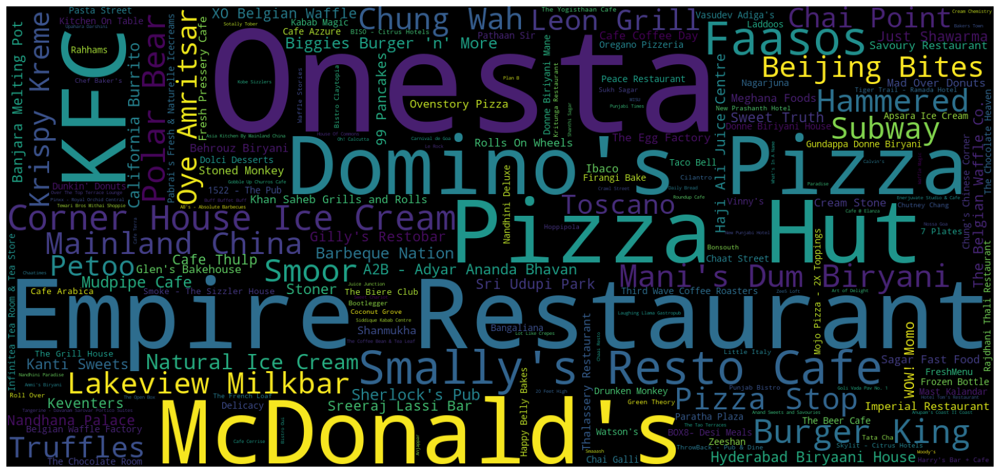

In [42]:
name_cloud = WordCloud(width=1500, height=700).generate_from_frequencies(df['name'].value_counts())
plt.figure(figsize=(20, 15))
plt.imshow(name_cloud)
plt.axis('off')
plt.show()

# Reviews by Customers

In [43]:
review_text = []
for r in df['reviews_list'].explode():
    if isinstance(r, tuple) and len(r) == 2:
        text = r[1][8:]
        text = text.replace('\n', ' ')
        review_text.append(text)

In [44]:
review_text[:5]

['A beautiful place to dine in.The interiors take you back to the Mughal era. The lightings are just perfect.We went there on the occasion of Christmas and so they had only limited items available. But the taste and service was not compromised at all.The only complaint is that the breads could have been better.Would surely like to come here again.',
 'I was here for dinner with my family on a weekday. The restaurant was completely empty. Ambience is good with some good old hindi music. Seating arrangement are good too. We ordered masala papad, panner and baby corn starters, lemon and corrionder soup, butter roti, olive and chilli paratha. Food was fresh and good, service is good too. Good for family hangout. Cheers',
 'Its a restaurant near to Banashankari BDA. Me along with few of my office friends visited to have buffet but unfortunately they only provide veg buffet. On inquiring they said this place is mostly visited by vegetarians. Anyways we ordered ala carte items which took ages

In [ ]:
review_words = []
eng_stopwords = stopwords.words('english')
for text in tqdm(review_text):
    text = text.replace('.', ' ')
    text = text.replace(',', ' ')
    text_split = text.split(' ')
    for i in text_split:
        x = str(i).strip().lower()
        if x.isalnum() and x not in eng_stopwords:
            review_words.append(x)

 99%|██████████████████████████████████████████████████████████████████ | 1052773/1067024 [22:16:51<00:05, 2686.03it/s]

In [ ]:
review_words_cloud = WordCloud(width=1500, height=700).generate_from_frequencies(Counter(review_words))
plt.figure(figsize=(20, 15))
plt.imshow(review_words_cloud)
plt.axis('off')
plt.show()

# Top Dishes in Each Restaurant Types

In [ ]:
type_count = df['listed_in(type)'].value_counts()
type_dishes = dict()
for t in type_count.index:
    type_dishes[t] = []
type_dishes['All'] = []
for _, row in df.iterrows():
    t = row['listed_in(type)']
    liked_dishes = row['dish_liked']
    type_dishes[t].extend(liked_dishes)
    type_dishes['All'].extend(liked_dishes)

In [ ]:
plt.figure(figsize=(20, 11), layout='constrained')
for ind, t in enumerate(type_dishes):
    dishes = type_dishes[t]
    dishes_cloud = WordCloud(width=900, height=1000).generate_from_frequencies(Counter(dishes))
    plt.subplot(2, 4, ind + 1)
    plt.imshow(dishes_cloud)
    plt.title(t)
    plt.axis('off')

# Top Cuisines in each Localities

In [ ]:
pd.options.display.max_rows = None

In [ ]:
loc_cus = OrderedDict()
for l in df['location'].value_counts().index:
    loc_cus[l] = []
for _, row in df.iterrows():
    loc = row['location']
    loc_cus[loc].extend(row['cuisines'])

In [ ]:
loc_top_cus = OrderedDict()
for l in loc_cus:
    lc = pd.Series(loc_cus[l])
    loc_top_cus[l] = lc.value_counts()[:5].index

In [ ]:
pd.DataFrame.from_dict(loc_top_cus, orient='index', columns=range(1, 6))

# Top Locations for each Cuisine

In [ ]:
cus_loc = OrderedDict()
for l in df['cuisines'].explode().value_counts().index:
    cus_loc[l] = []
for _, row in df.iterrows():
    loc = row['location']
    cusines = row['cuisines']
    for c in cusines:
        cus_loc[c].append(loc)

In [ ]:
cus_top_loc = OrderedDict()
for c in cus_loc:
    ll = pd.Series(cus_loc[c])
    cus_top_loc[c] = ll.value_counts()[:5].index

In [ ]:
pd.DataFrame.from_dict(cus_top_loc, orient='index', columns=range(1, 6))

In [ ]:
pd.reset_option('display')

# Conclusion

In [ ]:
print('The analysis of this dataset gives us a rough idea of what the restaurantsin Bengaluru are really about and what the people in the city want and love.')